In [37]:
import pandas as pd
import numpy as np
import pickle
import json
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import os
import umap
import umap.plot
import CGREncoder
import Cluster
import cudf
import cuml
import cupy
import pylab
from scipy import sparse
from scipy.ndimage import gaussian_filter
from sklearn.manifold import TSNE
from cuml.cluster import KMeans as cuK
from sklearn.preprocessing import LabelBinarizer
from cuml.manifold.umap import UMAP as clUMAP
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
%matplotlib inline

In [2]:
kallGrp = ['high', 'low', 'veh', 'pt']
kallCounts = {}
kallIdx = {}
for grp in kallGrp:
    kallPath = '/home/lima/Project/simulation/Comparision/{grp}/Normalized/NormalizedKallCounts.csv'.format(grp =grp)
    counts = pd.read_csv(kallPath)
    counts.rename(columns = {'Unnamed: 0': 'GeneID'}, inplace = True)
    kallCounts[grp] = counts
    kallIdx[grp] = set(counts['GeneID'])

In [3]:
ids = list(kallIdx.values())
pivot = ids[0]
index = 1
while index < len(ids):
    if len(ids[index] - pivot) != 0:
        print('{index} is different from index 0'.format(index = index))
    else:
        print('All sets have the same gene ids')
    index += 1

All sets have the same gene ids
All sets have the same gene ids
All sets have the same gene ids


In [3]:
# encoder = CGREncoder.EncodingGivenGenes(pivot)
# encoder.convert(2, 14)

In [4]:
# result = encoder.getConvertedMatrix()

In [13]:
"""
pkl_out = open('/home/lima/Project/simulation/Comparision/pickles/ConvertedGeneIDsForKallistoProcessedNoCut.pkl', 'wb')
pickle.dump(result._getvalue(), pkl_out)
pkl_out.close()
json_out = open('/home/lima/Project/simulation/Comparision/pickles/ConvertedGeneIDsForKallistoProcessedNoCut.pkl', 'w')
json.dump(result._getvalue(), json_out)
json_out.close()
"""

In [3]:
pkl_in = open('/home/lima/Project/simulation/Comparision/pickles/ConvertedGeneIDsForKallistoProcessedNoCut.pkl', 'rb')
result = pickle.load(pkl_in)
pkl_in.close()

In [4]:
tempDict = {}
for key, value in result.items():
    tempDict[key] = value[0]
cgrMtrx = pd.DataFrame.from_dict(tempDict, orient = 'index')
cgrMtrx.sort_index(inplace = True)
# cgrMtrx.reset_index(inplace = True)
# cgrMtrx.rename(columns = {'index': 'GeneID'}, inplace = True)
cgrMtrx = cgrMtrx.to_numpy()

In [74]:
# samples = list(kallCounts['high'].columns.values)
# samples = samples[1 : ]
# highCounts = kallCounts['high'].to_numpy()
# highCounts = highCounts.reshape(len(highCounts), 1)
# countOne = highCounts[ : , 1].reshape(len(highCounts), 1)
# sample = [samples[1]] * len(highCounts)

In [48]:
def combineMatrices(group, by_group = False, pca = False, filters = None, sigma = 1):
    print('Process {group}'.format(group = group))
    _tmpList = []
    _samples = list(kallCounts[group].columns.values)
    if group == 'pt':
        _samples = _samples[1]
    else:
        _samples = _samples[1 : ]
    _counts = kallCounts[group].drop(columns = 'GeneID')
    _counts = _counts.to_numpy()
    _length = len(counts)
    _index = 0
    _tmparr = np.zeros_like(cgrMtrx)
    while _index < len(_samples):
        _count = _counts[ : , _index].reshape(_length, 1)
        _sample = _samples[_index]
        if _sample != 'PTSimulated':
            print('Counts * cgrMatrix for {sample}'.format(sample = _sample))
            multiple = _count * cgrMtrx
            
            if filters == 'fft':
                f = np.fft.fft2(multiple)
                fshift = np.fft.fftshift(f)
                multiple = 20 * np.log(np.abs(fshift))
            
            if filters == 'gauss':
                multiple = gaussian_filter(multiple, sigma = sigma)
                
            if pca == True:
                print('PCA decomposition for {sample}'.format(sample = _sample))
                pca = PCA(n_components = 2, svd_solver = 'full', random_state = 42)
                multiple = pca.fit_transform(multiple)
            if by_group == True:
                _tmparr += multiple
                # df = pd.DataFrame(__tmparr)
                # df['Labels'] = [_sample] * _length
            else:
                __tmparr = multiple
                df = pd.DataFrame(_tmparr)
                df['Labels'] = [group] * _length
            # print(df)
                print('Put {sample} into list for concatenation'.format(sample = _sample))
                _tmpList.append(_tmparr)
        else:
            print('Done')
        _index += 1
    if by_group == True:
        df = pd.DataFrame(_tmparr / 3)
        pd['Labels'] = [group] * _length
        _back_info = group
    else:
        df = pd.concat(_tmpList, axis = 0)
        # pd['Labels'] = [_sample] * _length
        _back_info = _samples
    return  _back_info, df

In [8]:
def plot_mapper(mapper, samples, labels, gpu_accelerated = False):
    if gpu_accelerated == True:
        mapper = mapper.to_pandas().values
    target = np.array(labels, dtype = np.str)
    encoder = LabelEncoder()
    encodedLabels = encoder.fit_transform(target)
    target = encodedLabels.astype(np.float32)
    fig, ax = plt.subplots(1, figsize = (14, 10))
    plt.scatter(mapper[ : , 1], mapper[ : , 0], s = 0.1, c = target, cmap = 'Spectral', alpha = 1.0)
    plt.setp(ax, xticks = [], yticks = [])
    cbar = plt.colorbar(boundaries = np.arange(5) - 0.5)
    cbar.set_ticks(np.arange(4))
    cbar.set_ticklabels(samples)
    plt.plot()

In [17]:
mapper = TSNE(n_jobs = 14).fit_transform(test_clust[['PCA1', 'PCA2']])

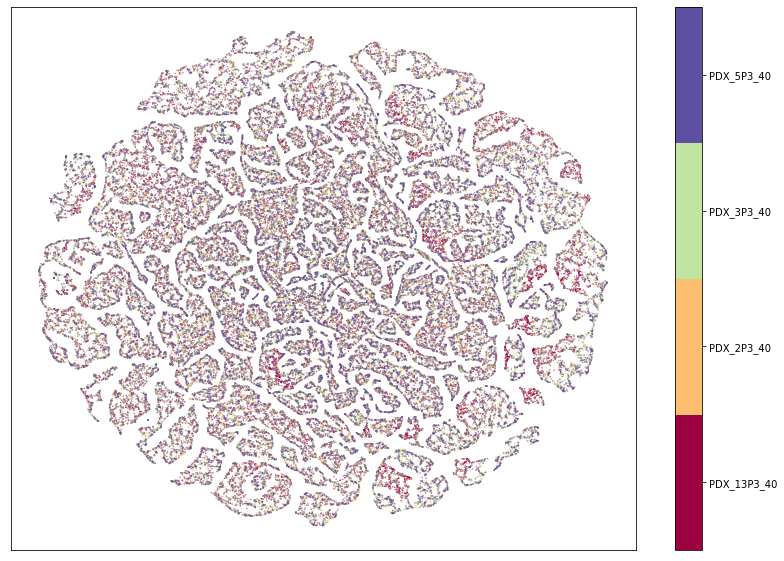

In [76]:
plot_mapper(mapper, samples, test_clust.Labels)

In [44]:
fft_mapper = TSNE(n_jobs = 14).fit_transform(fft_dict.iloc[ : , 0 : 15])

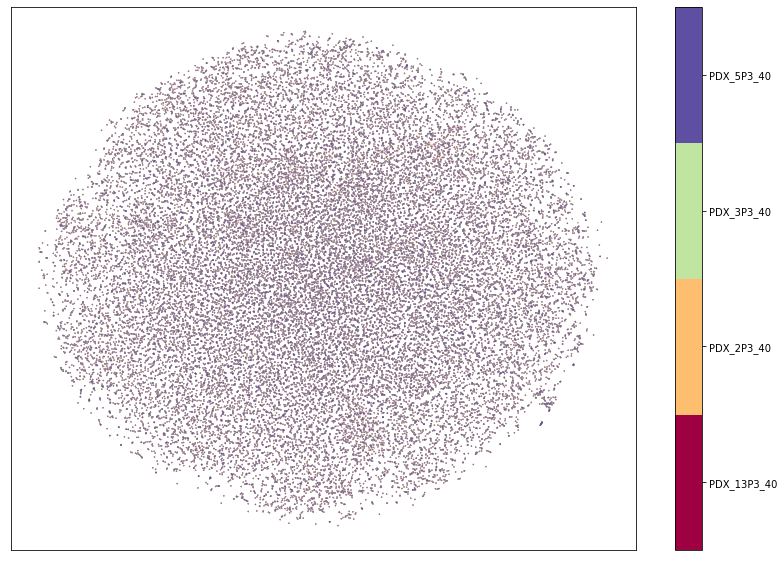

In [77]:
plot_mapper(fft_mapper, samples, fft_dict.Labels)

In [6]:
def kmean(n_clusters, dataSets, random_state = 42, oversampling_factor = 40):
    km = {}
    for n_cluster in n_clusters:
        for key, value in dataSets.items():
            cuKmean = cuK(init = 'k-means||', n_clusters = n_cluster, oversampling_factor = oversampling_factor,
                          random_state = random_state)
            cuKmean.fit(value)
            center = cuKmean.cluster_centers_
            km[(n_cluster, key)] = center
    return km

In [8]:
def centriod_plot(nrow, ncol, centers):
    params = {'legend.fontsize': 12, 
                    'font.family': 'serif',
                    'font.weight': 'medium',
                    'font.variant': 'normal',
                    #'figure.figsize': (10, 10), 
                    'figure.edgecolor': '#04253a', 
                    'figure.titlesize': 12, 
                    'axes.labelsize': 6, 
                    'axes.titlesize': 12, 
                    'xtick.labelsize': 6, 
                    'ytick.labelsize': 6}
    pylab.rcParams.update(params)
    fig, axes = plt.subplots(nrow, ncol, figsize = (14, 14), constrained_layout = True)
    # print(axes.shape)
    width = ncol
    height = nrow
    index = 0
    for key, value in centers.items():
        x_corrd = int(index / ncol)
        y_corrd = int(index % nrow)
        ax = axes[x_corrd, y_corrd]
        ax.scatter(cupy.asnumpy(value[0].values), cupy.asnumpy(value[1].values), facecolors = 'none', 
               edgecolors = 'red', s = 100)
        title = 'cuml Kmeans with {n} clusters for {transformed} data'.format(n = key[0], transformed = key[1])
        ax.set_title(title)
        index += 1
    plt.show()

In [30]:
high_samples, high = combineMatrices('high', False, None)

cuda_data = cudf.DataFrame.from_pandas(high.iloc[ : , 0 : 16])
cuda_label = cudf.Series(high.Labels)

fft_samples, fft_dict = combineMatrices('high', False, 'fft')
cuda_fft_data = cudf.DataFrame.from_pandas(fft_dict.iloc[ : , 0 : 16])
cuda_fft_label = cudf.Series(fft_dict.Labels)
dataSets = {'not filtered': cuda_data, 'fft filtered': cuda_fft_data}
n_clusters = [4, 8]

Process high
Counts * cgrMatrix for PDX_13P3_40
Put PDX_13P3_40 into list for concatenation
Counts * cgrMatrix for PDX_2P3_40
Put PDX_2P3_40 into list for concatenation
Counts * cgrMatrix for PDX_3P3_40
Put PDX_3P3_40 into list for concatenation
Counts * cgrMatrix for PDX_5P3_40
Put PDX_5P3_40 into list for concatenation
Process high
Counts * cgrMatrix for PDX_13P3_40
Put PDX_13P3_40 into list for concatenation
Counts * cgrMatrix for PDX_2P3_40
Put PDX_2P3_40 into list for concatenation
Counts * cgrMatrix for PDX_3P3_40
Put PDX_3P3_40 into list for concatenation
Counts * cgrMatrix for PDX_5P3_40
Put PDX_5P3_40 into list for concatenation


In [31]:
centers = kmean(n_clusters, dataSets.copy())

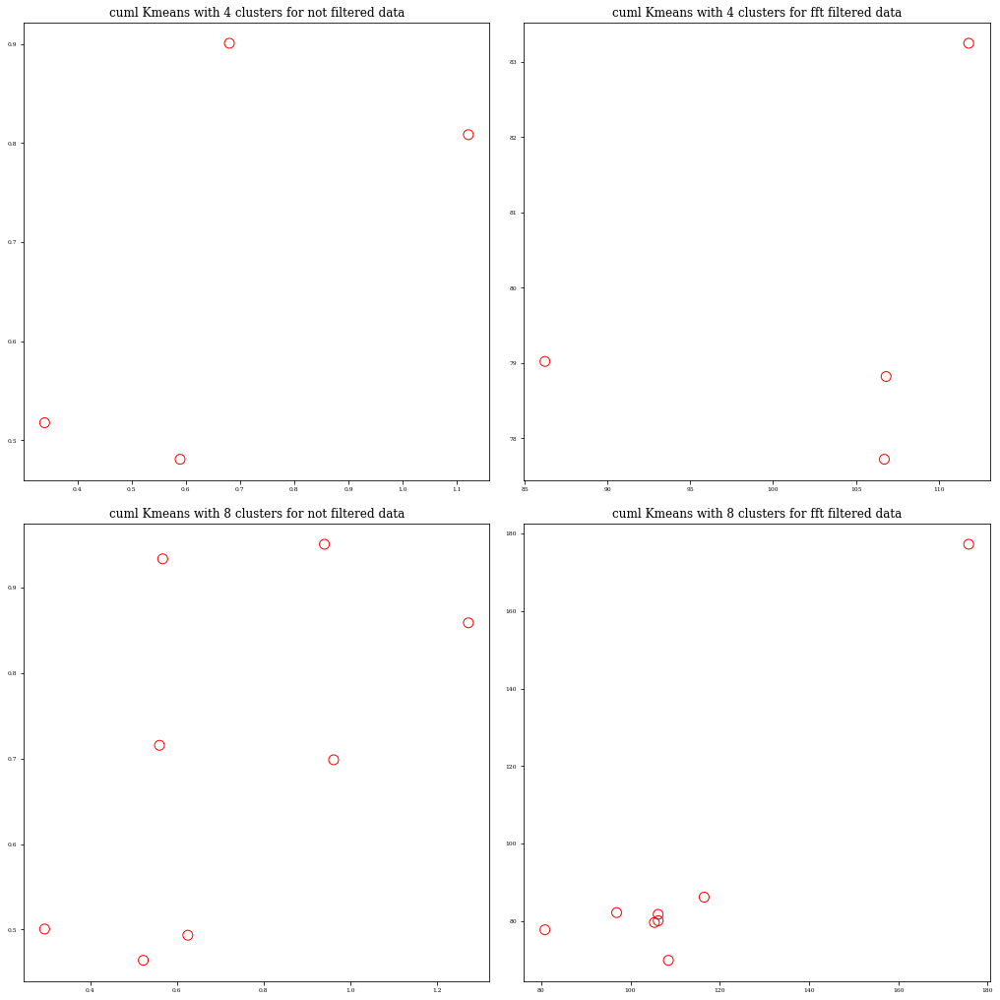

In [32]:
centriod_plot(2, 2, centers)

In [33]:
def tsneMapper(dataSets, n_neighbors, random_state = 42):
    cuts = {}
    for n in n_neighbors:
        cuTsne = cuml.TSNE(random_state = random_state, n_neighbors = n)
        for key, value in dataSets.items():
            cutMapper = cuTsne.fit_transform(value)

            # labels = value.Labels
            cuts[(key, n)] = cutMapper.to_pandas().values
            print((key, n))
    return cuts

In [34]:
def manifold_plot(mappers, nrow, ncol, samples, labels, gpu_accelerated = True):
    fig, axes = plt.subplots(nrow, ncol, figsize = (24, 36), constrained_layout = True)

    width = ncol
    height = nrow
    index = 0
    for key, value in mappers.items():
        # if gpu_accelerated == True:
        #    mapper = value.to_pandas().values
        # samples = labels.unique()
        # print(value)
        print(labels.unique())
        target = np.array(labels, dtype = np.str)
        encoder = LabelEncoder()
        encodedLabels = encoder.fit_transform(target)
        # target = encodedLabels.astype(np.float32)
        # fig, ax = plt.subplots(1, figsize = (14, 10))
        x_corrd = int(index / ncol)
        y_corrd = int(index % ncol)
        # print([index, x_corrd, y_corrd])
        ax = axes[x_corrd, y_corrd]
        im = ax.scatter(value[ : , 1], value[ : , 0], s = 0.1, c = encodedLabels, cmap = 'Spectral', alpha = 1.0)
        ax.set_xticks([])
        ax.set_yticks([])
        title_str = "{processed} data with {n} neighbors".format(processed = key[0], n = key[1])
        ax.set_title(title_str)
        ax.title.set_fontsize(20)
        index += 1
    cbar = plt.colorbar(im, ax = axes, boundaries = np.arange(len(samples) + 1) - 0.5)
    cbar.set_ticks(np.arange(len(samples)))
    cbar.set_ticklabels(samples)
    cbar.ax.tick_params(labelsize = 12)
    plt.plot()

In [35]:
n = [5, 15, 50, 100, 150, 200]
t_mapper = tsneMapper(dataSets.copy(), n)

('not filtered', 5)
('fft filtered', 5)
('not filtered', 15)
('fft filtered', 15)
('not filtered', 50)
('fft filtered', 50)
('not filtered', 100)
('fft filtered', 100)
('not filtered', 150)
('fft filtered', 150)
('not filtered', 200)
('fft filtered', 200)


['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']


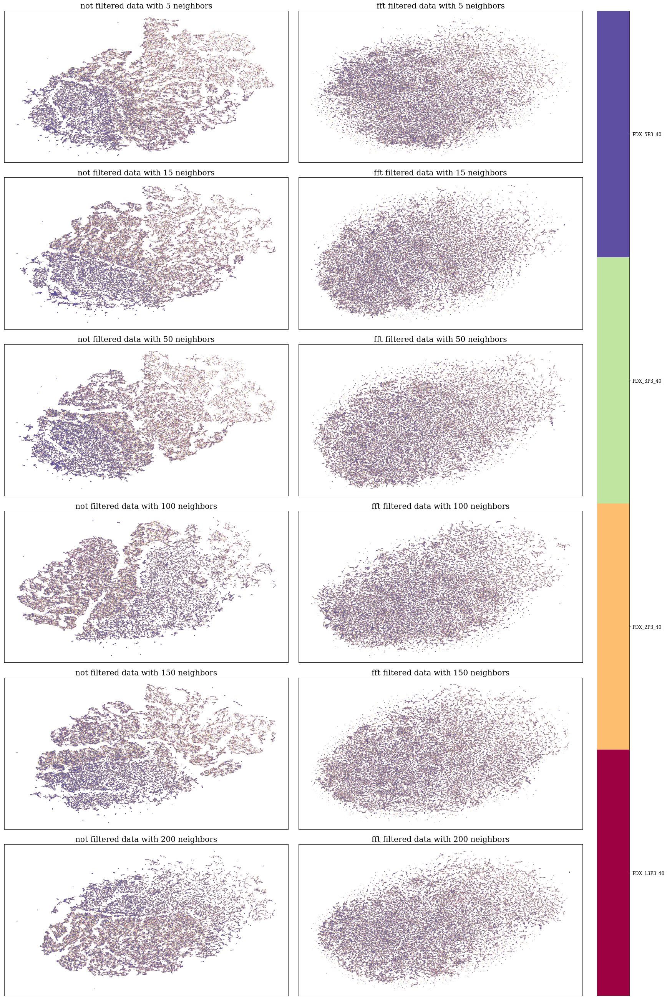

In [36]:
manifold_plot(t_mapper, 6, 2, high_samples, high.Labels)

In [39]:
gauss_samples, gauss_dict = combineMatrices('high', False, 'gauss')
cuda_gauss_data = cudf.DataFrame.from_pandas(gauss_dict.iloc[ : , 0 : 16])
cuda_gauss_label = cudf.Series(gauss_dict.Labels)
dataSets = {'not filtered': cuda_data, 'gauss filtered': cuda_gauss_data}

Process high
Counts * cgrMatrix for PDX_13P3_40
Put PDX_13P3_40 into list for concatenation
Counts * cgrMatrix for PDX_2P3_40
Put PDX_2P3_40 into list for concatenation
Counts * cgrMatrix for PDX_3P3_40
Put PDX_3P3_40 into list for concatenation
Counts * cgrMatrix for PDX_5P3_40
Put PDX_5P3_40 into list for concatenation


In [40]:
n = [5, 15, 50, 100, 150, 200]
t_mapper = tsneMapper(dataSets.copy(), n)

('not filtered', 5)
('gauss filtered', 5)
('not filtered', 15)
('gauss filtered', 15)
('not filtered', 50)
('gauss filtered', 50)
('not filtered', 100)
('gauss filtered', 100)
('not filtered', 150)
('gauss filtered', 150)
('not filtered', 200)
('gauss filtered', 200)


['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']
['PDX_13P3_40' 'PDX_2P3_40' 'PDX_3P3_40' 'PDX_5P3_40']


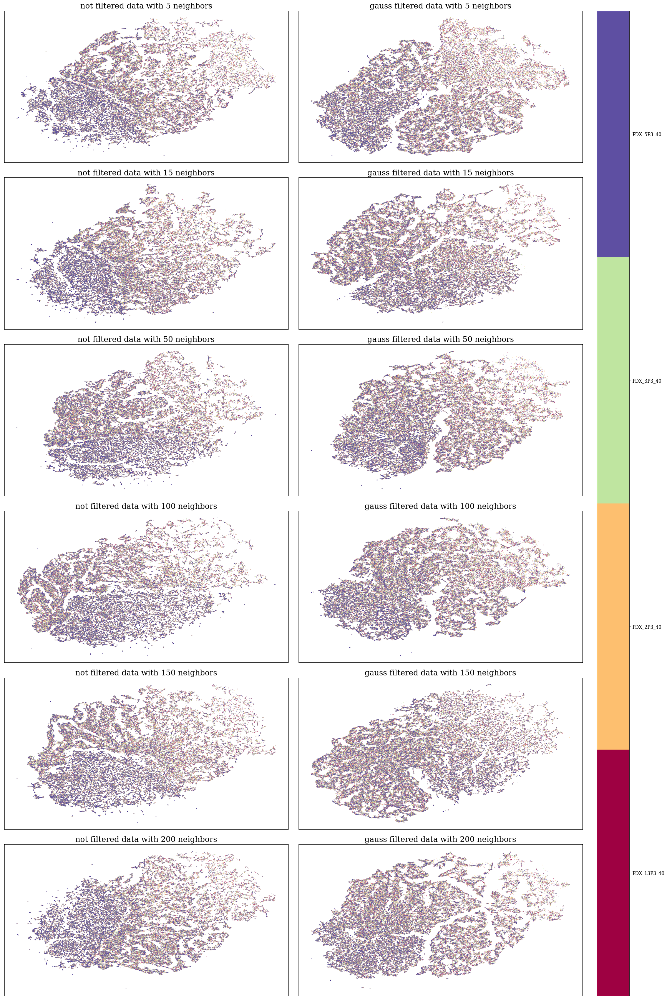

In [41]:
manifold_plot(t_mapper, 6, 2, high_samples, high.Labels)

In [47]:
high_info, high = combineMatrices('high', True, False, None, 1)

Process high
Counts * cgrMatrix for PDX_13P3_40
Counts * cgrMatrix for PDX_2P3_40
Counts * cgrMatrix for PDX_3P3_40
Counts * cgrMatrix for PDX_5P3_40


UnboundLocalError: local variable '__tmparr' referenced before assignment